<a href="https://colab.research.google.com/github/haniklakhe18/Temperature_analysis/blob/main/Split_database.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
%cd '/content/drive/My Drive/Indices/Ensemble'


/content/drive/.shortcut-targets-by-id/1BBkjA5D9rIVQl4WqjLSgE0LYjPK4dPfq/Indices/Ensemble


In [6]:
!pip install geopandas
!pip install rasterio
!pip install pyidw
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import pandas as pd
import numpy as np
import fiona
from sklearn.metrics import mean_squared_error
import rasterio
import rasterio.plot
import rasterio.mask
import glob
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns
from matplotlib.colors import Normalize
import math
import os
from pyproj import CRS
from matplotlib.lines import Line2D
import matplotlib.ticker as ticker
from tqdm import tqdm


  Using cached pyidw-0.2.20.tar.gz (13 kB)
  Preparing metadata (setup.py) ... done
  Using cached sklearn-0.0.post12.tar.gz (2.6 kB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [7]:
# List of climate models and scenarios
CM = ['ACCESS-CM2']

scenario = ['ssp126']

# Read location data
location = pd.read_csv('Location.csv')
location['Station'] = location['Station']
indice_list = []
for j in tqdm(range(len(scenario))):  # Iterate over all scenarios
  for i in range(len(CM)):
    filepath = CM[i] + '/' + scenario[j] + '/'
    files = glob.glob('Database' + '/' + filepath + '*.csv')
    files = list(sorted(files, key=lambda path: os.path.basename(path)))
    for k in range(0, len(files)):
      indices = pd.read_csv(files[k])
      base_name = os.path.basename(files[k])
      indice_name = os.path.splitext(base_name)[0]
      indice_list.append(indice_name)
print(indice_list)

100%|██████████| 1/1 [00:26<00:00, 26.78s/it]

['CSDI', 'DTR', 'FD', 'ID', 'Nlt10p', 'Ntg90p', 'SU', 'TMge10', 'TMge30', 'TMge35', 'TMge5', 'TMlt10', 'TMlt5', 'TMm', 'TN', 'TNlt2', 'TNltm2', 'TNltm20', 'TNm', 'TNn', 'TNx', 'TR', 'TXm', 'TXn', 'TXx', 'WSDI', 'X95p', 'Xlt10p', 'Xtg50p', 'Xtg90p']


In [ ]:
# List of climate models and scenarios
CM = ['ACCESS-CM2','ACCESS-ESM1-5','BCC-CSM2-MR','CanESM5','EC-Earth3','EC-Earth3-Veg','INM-CM4-8',
      'INM-CM5-0','MPI-ESM1-2-HR','MPI-ESM1-2-LR','MRI-ESM2-0','NorESM2-LM','NorESM2-MM']
#CM = ['ACCESS-CM2']
scenario = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# Read location data
location = pd.read_csv('Location.csv')
location['Station'] = location['Station']

indices_list = ['CSDI', 'DTR', 'FD', 'ID', 'Nlt10p', 'Ntg90p', 'SU', 'TMge10', 'TMge30', 'TMge35', 'TMge5',
 'TMlt10', 'TMlt5', 'TMm', 'TNlt2', 'TNltm2', 'TNltm20', 'TNm', 'TNn', 'TNx', 'TR', 'TXm', 'TXn', 'TXx', 'WSDI', 'X95p', 'Xlt10p', 'Xtg50p', 'Xtg90p']
for k in range(len(indices_list)):
  for j in range(len(scenario)):
    for i in range(len(CM)):
      filepath = CM[i] + '/' + scenario[j] + '/'
      indices = pd.read_csv('Database' + '/' + filepath + indices_list[k] + '.csv')
      indices = indices.iloc[:,:-5]
      # Merge with location data
      indices = pd.merge(indices, location, on='Station')
      # Define conditions for regions based on longitude
      conditions = [(indices['Lon'] < 83),
                    (indices['Lon'] >= 83) & (indices['Lon'] < 86),
                    (indices['Lon'] >= 86)]
      values = ['Western', 'Central', 'Eastern']
      # Assign regions based on conditions
      indices['Regions'] = np.select(conditions, values)
      indices = indices.drop('Station', axis = 1)
      region_wise = indices.groupby('Regions').mean()
      region_wise_T = region_wise.transpose()
      region_wise_T = region_wise_T.iloc[75:-2,:]
      region_wise_T['CMs'] = CM[i]
      region_wise_T = region_wise_T.reset_index()
      region_wise_T = region_wise_T.rename(columns = {'index':'Year'})
      if i == 0:
        combine = region_wise_T.copy()
      else:
        combine = pd.concat([combine, region_wise_T])
      combine['SSPs'] = scenario[j]
      if j == 0:
        ultra = combine.copy()
      else:
        ultra = pd.concat([ultra,combine])
  ultra.to_csv('/content/drive/Shared drives/RT_TAMU/Output/' + indices_list[k] + '.csv', index = False)

In [ ]:
indices_list = ['TXx', 'TNn']
indices_df_list = []
for i in range(len(indices_list)):
  data = pd.read_csv('/content/drive/Shared drives/RT_TAMU/Output/' + indices_list[i] + '.csv')
  data.columns
  indices_df_list.append(data)

sns.set_style("whitegrid")
fig, axs = plt.subplots(len(indices_list), 3 , figsize=(16, 10), dpi = 300)
fig.subplots_adjust(hspace=0.3, wspace=0.3)

for i in tqdm(range(len(indices_list))):
    df = indices_df_list[i]
    for j in range(0, len(df.columns)-3):
      ax = axs[i, j]  # Access the correct subplot
      ax = sns.lineplot(ax=ax, data= df , x= 'Year', y= df.columns[j+1], hue ='SSPs',linewidth=1)
      ax.xaxis.set_major_locator(ticker.MultipleLocator(base=25))
      ax.set_title(' ', fontsize=16)  # Set title
      ax.set_xlabel(' ', fontsize=14)
      ax.set_ylabel(' ', fontsize=14)
      ax.tick_params(axis='x', labelsize=14)  # Set x-axis tick label font size
      ax.tick_params(axis='y', labelsize=14)  # Set y-axis tick label font size
      ax.get_legend().remove()
      if i == 1:
        ax.set_xlabel('Year', fontsize=16)
        ax.set_ylim(-12,3.99)
      else:
        ax.set_ylim(30,40)

        ax.set_title(df.columns[j+1], fontsize=20)  # Set title
      if j ==0:
        ax.set_ylabel(indices_list[i], fontsize=16)
# Adding a legend outside of the plot
handles, labels = axs[0, 0].get_legend_handles_labels()
legend = fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.065), ncol = 4, title = 'SSP scenarios')
plt.setp(legend.get_title(), fontsize='14')
plt.setp(legend.get_texts(), fontsize='14')
plt.tight_layout()
plt.savefig('/content/drive/Shared drives/RT_TAMU/Output/Lineplot/' + 'TXx_TNn_lineplot.png')

100%|██████████| 2/2 [00:49<00:00, 24.53s/it]


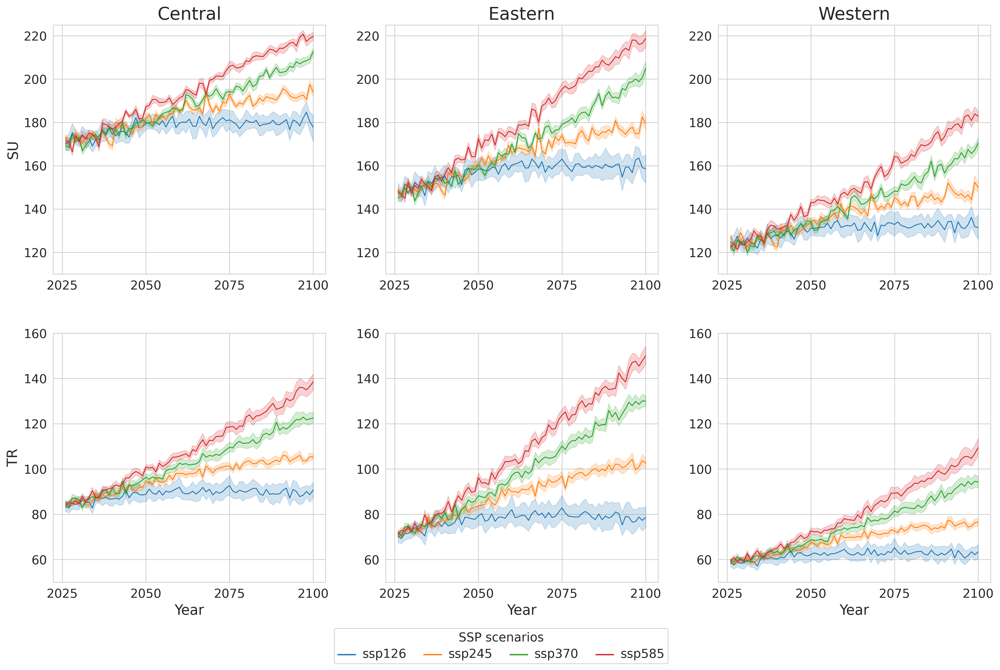

In [ ]:
indices_list = ['SU','TR']
indices_df_list = []
for i in range(len(indices_list)):
  data = pd.read_csv('/content/drive/Shared drives/RT_TAMU/Output/' + indices_list[i] + '.csv')
  data.columns
  indices_df_list.append(data)

sns.set_style("whitegrid")
fig, axs = plt.subplots(len(indices_list), 3 , figsize=(16, 10), dpi = 300)
fig.subplots_adjust(hspace=0.3, wspace=0.3)

for i in tqdm(range(len(indices_list))):
    df = indices_df_list[i]
    for j in range(0, len(df.columns)-3):
      ax = axs[i, j]  # Access the correct subplot
      ax = sns.lineplot(ax=ax, data= df , x= 'Year', y= df.columns[j+1], hue ='SSPs',linewidth=1)
      ax.xaxis.set_major_locator(ticker.MultipleLocator(base=25))
      ax.set_title(' ', fontsize=16)  # Set title
      ax.set_xlabel(' ', fontsize=14)
      ax.set_ylabel(' ', fontsize=14)
      ax.tick_params(axis='x', labelsize=14)  # Set x-axis tick label font size
      ax.tick_params(axis='y', labelsize=14)  # Set y-axis tick label font size
      ax.get_legend().remove()
      if i == 1:
        ax.set_xlabel('Year', fontsize=16)
        ax.set_ylim(50,160)
      else:
        ax.set_ylim(110,225)

        ax.set_title(df.columns[j+1], fontsize=20)  # Set title
      if j ==0:
        ax.set_ylabel(indices_list[i], fontsize=16)
# Adding a legend outside of the plot
handles, labels = axs[0, 0].get_legend_handles_labels()
legend = fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.065), ncol = 4, title = 'SSP scenarios')
plt.setp(legend.get_title(), fontsize='14')
plt.setp(legend.get_texts(), fontsize='14')
plt.tight_layout()
plt.savefig('/content/drive/Shared drives/RT_TAMU/Output/Lineplot/' + 'SU_TN_lineplot.png')

100%|██████████| 2/2 [00:47<00:00, 23.78s/it]


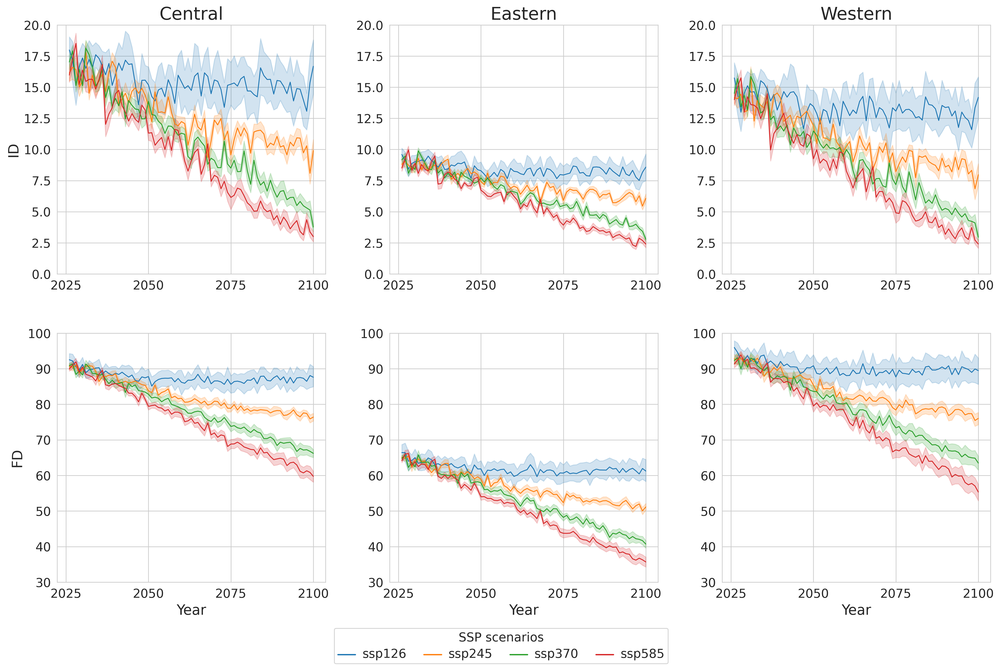

In [ ]:
indices_list = ['ID','FD']
indices_df_list = []
for i in range(len(indices_list)):
  data = pd.read_csv('/content/drive/Shared drives/RT_TAMU/Output/' + indices_list[i] + '.csv')
  data.columns
  indices_df_list.append(data)

sns.set_style("whitegrid")
fig, axs = plt.subplots(len(indices_list), 3 , figsize=(16, 10), dpi = 300)
fig.subplots_adjust(hspace=0.3, wspace=0.3)

for i in tqdm(range(len(indices_list))):
    df = indices_df_list[i]
    for j in range(0, len(df.columns)-3):
      ax = axs[i, j]  # Access the correct subplot
      ax = sns.lineplot(ax=ax, data= df , x= 'Year', y= df.columns[j+1], hue ='SSPs',linewidth=1)
      ax.xaxis.set_major_locator(ticker.MultipleLocator(base=25))
      ax.set_title(' ', fontsize=16)  # Set title
      ax.set_xlabel(' ', fontsize=14)
      ax.set_ylabel(' ', fontsize=14)
      ax.tick_params(axis='x', labelsize=14)  # Set x-axis tick label font size
      ax.tick_params(axis='y', labelsize=14)  # Set y-axis tick label font size
      ax.get_legend().remove()
      if i == 1:
        ax.set_xlabel('Year', fontsize=16)
        ax.set_ylim(30,100)
      else:
        ax.set_ylim(0,20)

        ax.set_title(df.columns[j+1], fontsize=20)  # Set title
      if j ==0:
        ax.set_ylabel(indices_list[i], fontsize=16)
# Adding a legend outside of the plot
handles, labels = axs[0, 0].get_legend_handles_labels()
legend = fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.065), ncol = 4, title = 'SSP scenarios')
plt.setp(legend.get_title(), fontsize='14')
plt.setp(legend.get_texts(), fontsize='14')
plt.tight_layout()
plt.savefig('/content/drive/Shared drives/RT_TAMU/Output/Lineplot/' + 'ID_FD_lineplot.png')

100%|██████████| 2/2 [00:46<00:00, 23.45s/it]


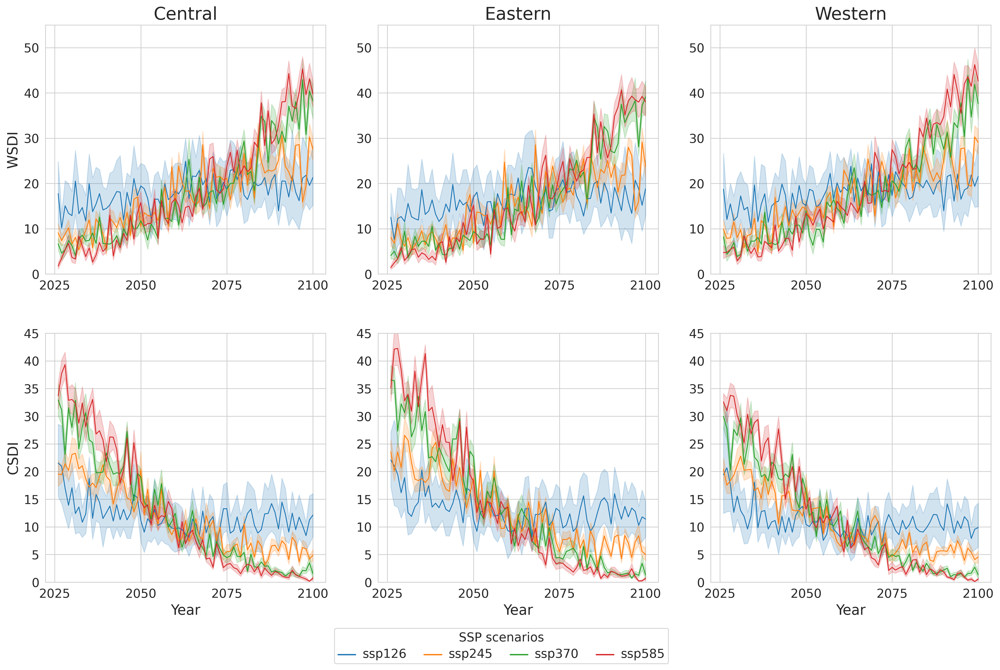

In [ ]:
indices_list = ['WSDI','CSDI']
indices_df_list = []
for i in range(len(indices_list)):
  data = pd.read_csv('/content/drive/Shared drives/RT_TAMU/Output/' + indices_list[i] + '.csv')
  data.columns
  indices_df_list.append(data)

sns.set_style("whitegrid")
fig, axs = plt.subplots(len(indices_list), 3 , figsize=(16, 10), dpi = 300)
fig.subplots_adjust(hspace=0.3, wspace=0.3)

for i in tqdm(range(len(indices_list))):
    df = indices_df_list[i]
    for j in range(0, len(df.columns)-3):
      ax = axs[i, j]  # Access the correct subplot
      ax = sns.lineplot(ax=ax, data= df , x= 'Year', y= df.columns[j+1], hue ='SSPs',linewidth=1)
      ax.xaxis.set_major_locator(ticker.MultipleLocator(base=25))
      ax.set_title(' ', fontsize=16)  # Set title
      ax.set_xlabel(' ', fontsize=14)
      ax.set_ylabel(' ', fontsize=14)
      ax.tick_params(axis='x', labelsize=14)  # Set x-axis tick label font size
      ax.tick_params(axis='y', labelsize=14)  # Set y-axis tick label font size
      ax.get_legend().remove()
      if i == 1:
        ax.set_xlabel('Year', fontsize=16)
        ax.set_ylim(0,45)
      else:
        ax.set_ylim(0,55)

        ax.set_title(df.columns[j+1], fontsize=20)  # Set title
      if j ==0:
        ax.set_ylabel(indices_list[i], fontsize=16)
# Adding a legend outside of the plot
handles, labels = axs[0, 0].get_legend_handles_labels()
legend = fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.065), ncol = 4, title = 'SSP scenarios')
plt.setp(legend.get_title(), fontsize='14')
plt.setp(legend.get_texts(), fontsize='14')
plt.tight_layout()
plt.savefig('/content/drive/Shared drives/RT_TAMU/Output/Lineplot/' + 'WSDI_CSDI_lineplot.png')

100%|██████████| 2/2 [00:47<00:00, 23.88s/it]


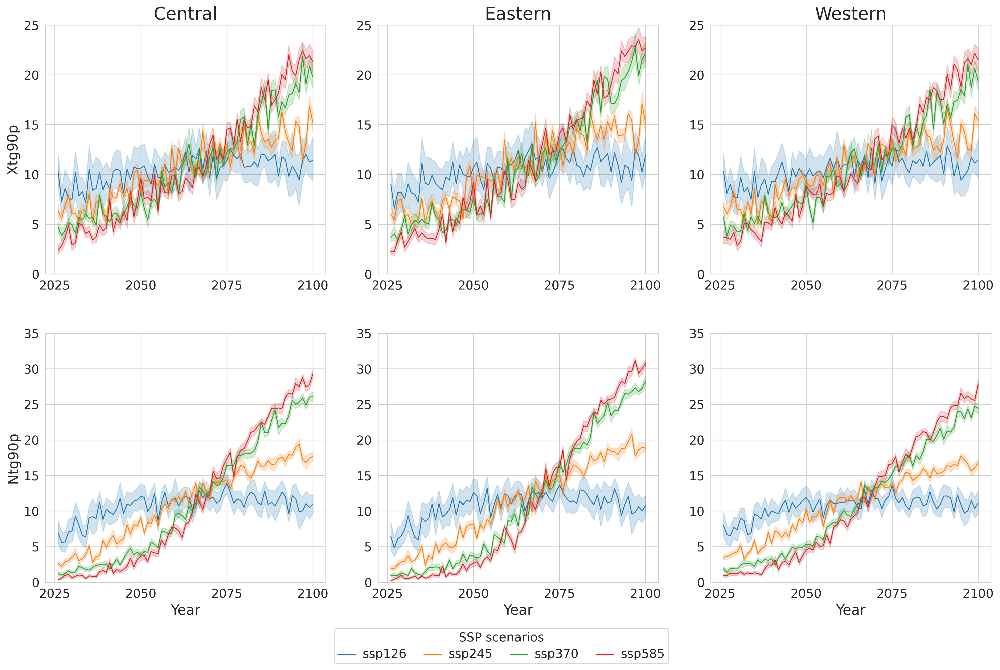

In [ ]:
indices_list = ['Xtg90p','Ntg90p']
indices_df_list = []
for i in range(len(indices_list)):
  data = pd.read_csv('/content/drive/Shared drives/RT_TAMU/Output/' + indices_list[i] + '.csv')
  data.columns
  indices_df_list.append(data)

sns.set_style("whitegrid")
fig, axs = plt.subplots(len(indices_list), 3 , figsize=(16, 10), dpi = 300)
fig.subplots_adjust(hspace=0.3, wspace=0.3)

for i in tqdm(range(len(indices_list))):
    df = indices_df_list[i]
    for j in range(0, len(df.columns)-3):
      ax = axs[i, j]  # Access the correct subplot
      ax = sns.lineplot(ax=ax, data= df , x= 'Year', y= df.columns[j+1], hue ='SSPs',linewidth=1)
      ax.xaxis.set_major_locator(ticker.MultipleLocator(base=25))
      ax.set_title(' ', fontsize=16)  # Set title
      ax.set_xlabel(' ', fontsize=14)
      ax.set_ylabel(' ', fontsize=14)
      ax.tick_params(axis='x', labelsize=14)  # Set x-axis tick label font size
      ax.tick_params(axis='y', labelsize=14)  # Set y-axis tick label font size
      ax.get_legend().remove()
      if i == 1:
        ax.set_xlabel('Year', fontsize=16)
        ax.set_ylim(0,35)
      else:
        ax.set_ylim(0,25)

        ax.set_title(df.columns[j+1], fontsize=20)  # Set title
      if j ==0:
        ax.set_ylabel(indices_list[i], fontsize=16)
# Adding a legend outside of the plot
handles, labels = axs[0, 0].get_legend_handles_labels()
legend = fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.065), ncol = 4, title = 'SSP scenarios')
plt.setp(legend.get_title(), fontsize='14')
plt.setp(legend.get_texts(), fontsize='14')
plt.tight_layout()
plt.savefig('/content/drive/Shared drives/RT_TAMU/Output/Lineplot/' + 'Xtg90p_Ntg90p_lineplot.png')

100%|██████████| 2/2 [00:47<00:00, 23.90s/it]


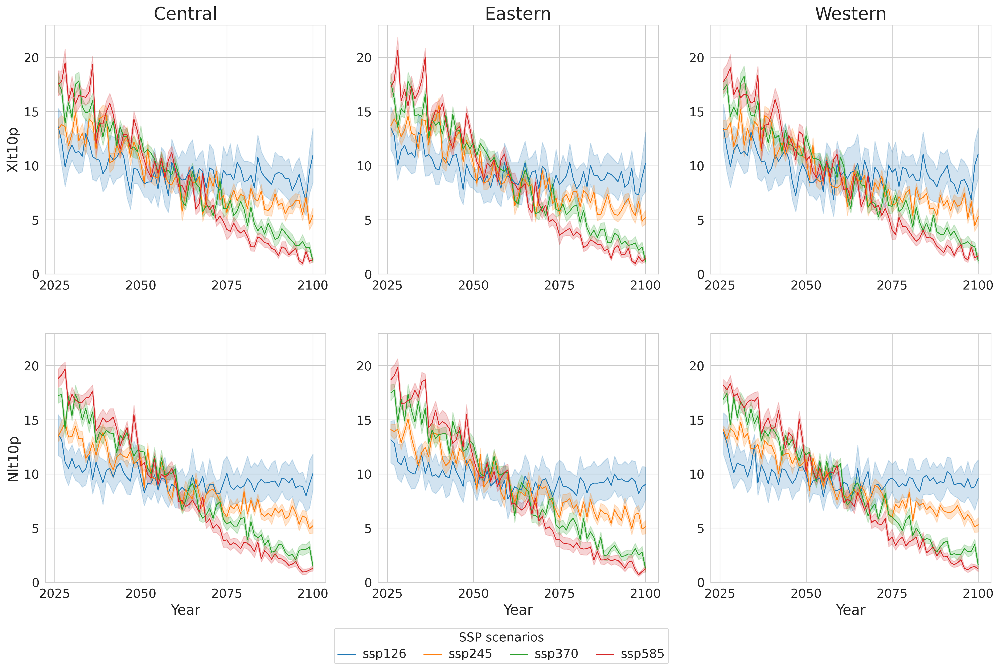

In [ ]:
indices_list = ['Xlt10p','Nlt10p']
indices_df_list = []
for i in range(len(indices_list)):
  data = pd.read_csv('/content/drive/Shared drives/RT_TAMU/Output/' + indices_list[i] + '.csv')
  data.columns
  indices_df_list.append(data)

sns.set_style("whitegrid")
fig, axs = plt.subplots(len(indices_list), 3 , figsize=(16, 10), dpi = 300)
fig.subplots_adjust(hspace=0.3, wspace=0.3)

for i in tqdm(range(len(indices_list))):
    df = indices_df_list[i]
    for j in range(0, len(df.columns)-3):
      ax = axs[i, j]  # Access the correct subplot
      ax = sns.lineplot(ax=ax, data= df , x= 'Year', y= df.columns[j+1], hue ='SSPs',linewidth=1)
      ax.xaxis.set_major_locator(ticker.MultipleLocator(base=25))
      ax.set_title(' ', fontsize=16)  # Set title
      ax.set_xlabel(' ', fontsize=14)
      ax.set_ylabel(' ', fontsize=14)
      ax.tick_params(axis='x', labelsize=14)  # Set x-axis tick label font size
      ax.tick_params(axis='y', labelsize=14)  # Set y-axis tick label font size
      ax.get_legend().remove()
      if i == 1:
        ax.set_xlabel('Year', fontsize=16)
        ax.set_ylim(0,23)
      else:
        ax.set_ylim(0,23)

        ax.set_title(df.columns[j+1], fontsize=20)  # Set title
      if j ==0:
        ax.set_ylabel(indices_list[i], fontsize=16)
# Adding a legend outside of the plot
handles, labels = axs[0, 0].get_legend_handles_labels()
legend = fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.065), ncol = 4, title = 'SSP scenarios')
plt.setp(legend.get_title(), fontsize='14')
plt.setp(legend.get_texts(), fontsize='14')
plt.tight_layout()
plt.savefig('/content/drive/Shared drives/RT_TAMU/Output/Lineplot/' + 'Xtl10p_Ntl10p_lineplot.png')